## Remove HETATMs from all PDB files create residue name list

In [4]:
import numpy as np
from Bio.PDB import *
import os
import matplotlib.pyplot as plt
import random
from itertools import chain
import seaborn as sns
import tensorflow
import pydot
import graphviz
parser = PDBParser()
# Remove the HETATMs (non-standard proteins)
os.makedirs('cleanAbAgData')
for filename in os.listdir("AbAgData"):
    allProteins = open("AbAgData/"+filename, 'r')
    onlyATMs = open('cleanAbAgData/'+filename, 'w')
    # Only keep lines without HETATM at the start
    for line in allProteins:
        if (line[0:6] != "HETATM"):
            onlyATMs.write(line)
    allProteins.close()
    onlyATMs.close()
amino3CodesStr = 'alaargasnaspcysgluglnglyhisileleulysmetpheproserthrtrptyrval'
amino3Codes = [amino3CodesStr[x:x+3].upper() for x in range(0, len(amino3CodesStr), 3)]
amino3Codes = list(sorted(amino3Codes))
print(amino3Codes)

FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'cleanAbAgData'

### Record all intra-antigen interactions
For each antigen, track every residue that interacts with the antibody (H/L chains) and add residue object to list 

Remove all non-amino acids in the list 

In [2]:
os.makedirs('AgFreqChart')
for filename in os.listdir("cleanAbAgData"):
    InteractingAgList = []
    data = parser.get_structure(filename[:-4], "cleanAbAgData/"+filename)
    chains = list(list(data.get_models())[0].get_chains())
    # Get antibody chains into list
    chainL, chainH = [], []
    for x in chains: 
        if x.id == "L":
            chainL = list(x.get_residues())
        if x.id == "H":
            chainH = list(x.get_residues())
    chainsLH = chainL + chainH

    # Create atom list of Ab residues for searching later 
    AbAtomList = [list(x.get_atoms()) for x in chainsLH if x.get_resname() in amino3Codes]
    AbAtomList = list(chain.from_iterable(AbAtomList))
    NBSearch = NeighborSearch(AbAtomList)

    ### Gather Ag residues interacting with Ab 
    for x in chains:
        currRes = list(x.get_residues())
        if x.id != "L" and x.id != "H":
            for res in currRes:
                for atm in list(res.get_atoms()):
                    centerPos = atm.coord
                    if len(NBSearch.search(centerPos, 5, 'R')) > 0:
                        InteractingAgList.append(res)
                        break # break after a single atom from the residue interacts with Ab 

    ### Get rid of non-amino acids 
    InteractingAgList = [residue for residue in InteractingAgList if residue.get_resname() in amino3Codes]

    # Initialize empty intra-antigen interaction list
    AgInteractionList = {}
    for i in range(len(amino3Codes)):
        for j in range(i, len(amino3Codes)):
            combinationName = amino3Codes[i] + " " + amino3Codes[j]
            AgInteractionList[combinationName] = 0

    ### Count intra-Ag interactions -> dict
    atms = [r.get_atoms() for r in InteractingAgList]
    if (len(atms) > 0):
        NBSearch2 = NeighborSearch(list(chain.from_iterable(atms))) # Count interactions using neighbor search
        AgInteractions = NBSearch2.search_all(5, level='R')
        for (r1, r2) in AgInteractions:
            combinationName = min([r1.get_resname(), r2.get_resname()]) + " " + max([r1.get_resname(), r2.get_resname()])
            AgInteractionList[combinationName] += 1

        ### Save dict as normalized chart numpy 2d array
        # Create frequency chart/triangle using the alphabetized amino codes
        freqChart = np.empty((20, 20))
        freqChart.fill(np.nan)
        for r in range(len(amino3Codes)):
            for c in range(r, len(amino3Codes)):
                fst, snd = amino3Codes[r], amino3Codes[c]
                combinationName = fst + " " + snd
                count = AgInteractionList[combinationName]
                freqChart[r, c] = count

        # Normalize
        freqChart -= np.nanmin(freqChart)
        freqChart /= (np.nanmax(freqChart) - np.nanmin(freqChart))
        # Save chart to file
        with open("AgFreqChart/FreqChart"+filename[:-4]+".npy", "wb") as f:
            np.save(f, freqChart)
    else:
        print(filename)

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5079
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5080
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5081
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5082
  warning

6JMQ_1.pdb


C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5196
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5197
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5198
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5199
  warning

### Displaying Antigen Freq Chart

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5079
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5080
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5081
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5082
  warning

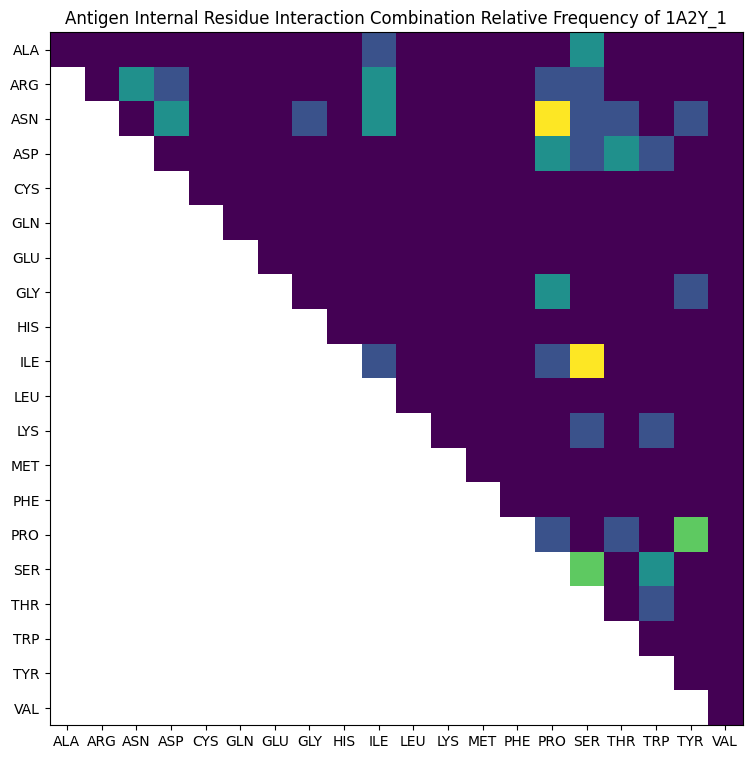

In [3]:
n = 0
for filename in os.listdir("cleanAbAgData"):
    n+=1
    if (n == 2):
        break
    InteractingAgList = []
    data = parser.get_structure(filename[:-4], "cleanAbAgData/"+filename)
    chains = list(list(data.get_models())[0].get_chains())
    chainL, chainH = [], []
    for x in chains:
        if x.id == "L":
            chainL = list(x.get_residues())
        if x.id == "H":
            chainH = list(x.get_residues())
    chainsLH = chainL + chainH

    # Create atom list of Ab residues for searching later 
    AbAtomList = [list(x.get_atoms()) for x in chainsLH if x.get_resname() in amino3Codes]
    AbAtomList = list(chain.from_iterable(AbAtomList))
    NBSearch = NeighborSearch(AbAtomList)

    ### Gather Ag residues interacting with Ab 
    for x in chains:
        currRes = list(x.get_residues())
        if x.id != "L" and x.id != "H":
            for res in currRes:
                for atm in list(res.get_atoms()):
                    centerPos = atm.coord
                    if len(NBSearch.search(centerPos, 5, 'R')) > 0:
                        InteractingAgList.append(res)
                        break # break after a single atom from the residue interacts with Ab 

    # Initialize empty intra-antigen interaction list
    AgInteractionList = {}
    for i in range(len(amino3Codes)):
        for j in range(i, len(amino3Codes)):
            combinationName = amino3Codes[i] + " " + amino3Codes[j]
            AgInteractionList[combinationName] = 0

    ### Count intra-Ag interactions -> dict
    atms = [r.get_atoms() for r in InteractingAgList if r.get_resname() in amino3Codes]
    NBSearch2 = NeighborSearch(list(chain.from_iterable(atms))) # Count interactions using neighbor search
    AgInteractions = NBSearch2.search_all(5, level='R')
    for (r1, r2) in AgInteractions:
        combinationName = min([r1.get_resname(), r2.get_resname()]) + " " + max([r1.get_resname(), r2.get_resname()])
        AgInteractionList[combinationName] += 1

    ### Save dict as normalized chart numpy 2d array
    # Create frequency chart/triangle using the alphabetized amino codes
    freqChart = np.empty((20, 20))
    freqChart.fill(np.nan)
    for r in range(len(amino3Codes)):
        for c in range(r, len(amino3Codes)):
            fst, snd = amino3Codes[r], amino3Codes[c]
            combinationName = fst + " " + snd
            count = AgInteractionList[combinationName]
            freqChart[r, c] = count
    # Normalize
    freqChart -= np.nanmin(freqChart)
    freqChart /= (np.nanmax(freqChart) - np.nanmin(freqChart))
    fig = plt.figure(figsize=(9, 9))
    ax = fig.add_subplot(111)
    ax.set_xticks(np.arange(0, 20, 1))
    ax.set_yticks(np.arange(0, 20, 1))
    ax.set_xticklabels(amino3Codes)
    ax.set_yticklabels(amino3Codes)
    ax.imshow(freqChart)
    plt.title("Antigen Internal Residue Interaction Combination Relative Frequency of 1A2Y_1")

### Record all intra-Ab interactions
Select CDR ranges and add to list 

Search for and record unique interactions 

In [4]:
ranges = [[27, 36], [48, 60], [91, 104]]
os.makedirs('AbFreqChart')
for filename in os.listdir("cleanAbAgData"):
    AbCDR = []
    data = parser.get_structure(filename[:-4], "cleanAbAgData/"+filename)
    chains = list(list(data.get_models())[0].get_chains())
    chainL, chainH = [], []
    for x in chains: 
        if x.id == "L":
            chainL = list(x.get_residues())
        if x.id == "H":
            chainH = list(x.get_residues())
    # Now the AbCDR region is contained inside the variable as a list of residues
    # Initialize empty intra-antibody interaction list
    AbInteractionList = {}
    for i in range(len(amino3Codes)):
        for j in range(i, len(amino3Codes)):
            combinationName = amino3Codes[i] + " " + amino3Codes[j]
            AbInteractionList[combinationName] = 0
    # Load region
    chainsLH = [chainL, chainH]
    for chainX in chainsLH:
        for r in ranges:
            fst, snd = r[0], r[1]
            AbCDR += chainX[fst-1: snd]
    # Count interactions
    atms = [r.get_atoms() for r in AbCDR if r.get_resname() in amino3Codes]
    if (len(atms) > 0):
        NBSearch = NeighborSearch(list(chain.from_iterable(atms)))
        AbInteractions = NBSearch.search_all(5, level='R')
        for (r1, r2) in AbInteractions:
            combinationName = min([r1.get_resname(), r2.get_resname()]) + " " + max([r1.get_resname(), r2.get_resname()])
            AbInteractionList[combinationName] += 1
        # Create frequency chart/triangle using the alphabetized amino codes
        freqChart = np.empty((20, 20))
        freqChart.fill(np.nan)
        for r in range(len(amino3Codes)):
            for c in range(r, len(amino3Codes)):
                fst, snd = amino3Codes[r], amino3Codes[c]
                combinationName = fst + " " + snd
                count = AbInteractionList[combinationName]
                freqChart[r, c] = count
        # Normalize
        freqChart -= np.nanmin(freqChart)
        freqChart /= (np.nanmax(freqChart) - np.nanmin(freqChart))
        # Save chart to file
        with open("AbFreqChart/FreqChart"+filename[:-4]+".npy", "wb") as f:
            np.save(f, freqChart)
# remove the file because no antigen side interaction
os.remove('AbFreqChart/FreqChart6JMQ_1.npy')

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5079
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5080
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5081
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5082
  warning

### Displaying Antibody Freq Chart

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5079
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5080
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5081
  warnings.warn(
C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\Bio\PDB\PDBParser.py:388: PDBConstructionWarning: Ignoring unrecognized record 'END' at line 5082
  warning

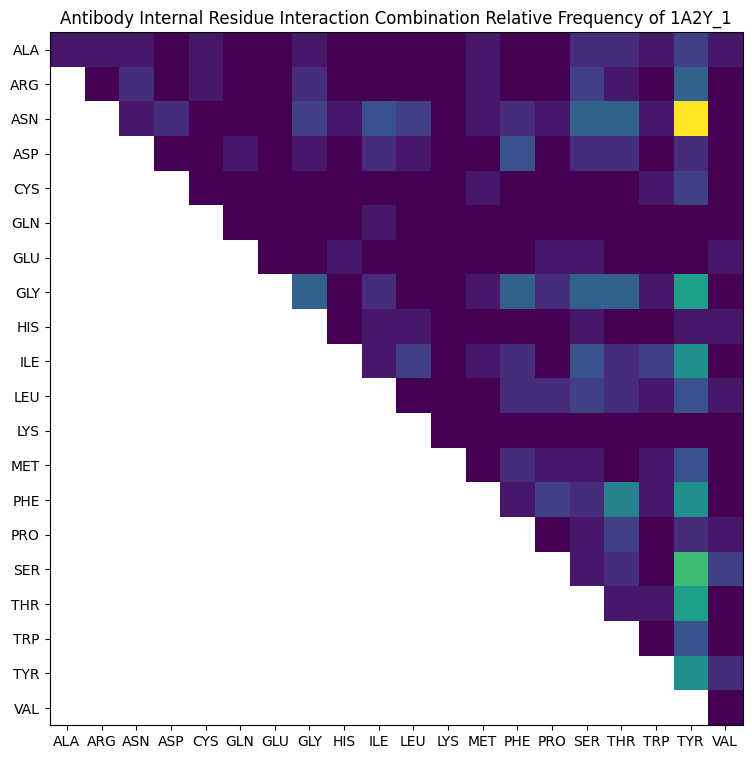

In [5]:
ranges = [[27, 36], [48, 60], [91, 104]]
n = 0
for filename in os.listdir("cleanAbAgData"):
    n+=1
    if (n > 1):
        break
    AbCDR = []
    data = parser.get_structure(filename[:-4], "cleanAbAgData/"+filename)
    chains = list(list(data.get_models())[0].get_chains())
    chainL, chainH = [], []
    for x in chains: 
        if x.id == "L":
            chainL = list(x.get_residues())
        if x.id == "H":
            chainH = list(x.get_residues())

    # Initialize empty intra-antibody interaction list
    AbInteractionList = {}
    for i in range(len(amino3Codes)):
        for j in range(i, len(amino3Codes)):
            combinationName = amino3Codes[i] + " " + amino3Codes[j]
            AbInteractionList[combinationName] = 0
    
    chainsLH = [chainL, chainH]
    for chainX in chainsLH:
        for r in ranges:
            fst, snd = r[0], r[1]
            AbCDR += chainX[fst-1: snd]

    # Count interactions using neighbor search
    atms = [r.get_atoms() for r in AbCDR if r.get_resname() in amino3Codes]
    NBSearch = NeighborSearch(list(chain.from_iterable(atms)))
    AbInteractions = NBSearch.search_all(5, level='R')
    for (r1, r2) in AbInteractions:
        combinationName = min([r1.get_resname(), r2.get_resname()]) + " " + max([r1.get_resname(), r2.get_resname()])
        AbInteractionList[combinationName] += 1

    # Create frequency chart/triangle using the alphabetized amino codes
    freqChart = np.empty((20, 20))
    freqChart.fill(np.nan)
    for r in range(len(amino3Codes)):
        for c in range(r, len(amino3Codes)):
            fst, snd = amino3Codes[r], amino3Codes[c]
            combinationName = fst + " " + snd
            count = AbInteractionList[combinationName]
            freqChart[r, c] = count
    # Normalize
    freqChart -= np.nanmin(freqChart)
    freqChart /= (np.nanmax(freqChart) - np.nanmin(freqChart))
    # plot
    fig = plt.figure(figsize=(9, 9))
    ax = fig.add_subplot(111)
    ax.set_xticks(np.arange(0, 20, 1))
    ax.set_yticks(np.arange(0, 20, 1))
    ax.set_xticklabels(amino3Codes)
    ax.set_yticklabels(amino3Codes)
    ax.imshow(freqChart)
    plt.title("Antibody Internal Residue Interaction Combination Relative Frequency of 1A2Y_1")

## Matching datasets

In [6]:
AbFreqCharts, AgFreqCharts = [], []
matchFreqCharts = []
os.makedirs('matchData')
for filename in os.listdir("AbFreqChart"):
    AbFreqCharts.append(np.load("AbFreqChart/"+filename))
for filename in os.listdir("AgFreqChart"):
    AgFreqCharts.append(np.load("AgFreqChart/"+filename))
for i, (Ab, Ag) in enumerate(zip(AbFreqCharts, AgFreqCharts)):
    flippedAb = np.flip(Ab)
    matchFreqChart = np.concatenate([flippedAb, Ag], axis=1)
    matchFreqChart = np.array([r[~np.isnan(r)] for r in matchFreqChart])
    with open("matchData/"+os.listdir("AbFreqChart")[i], "wb") as f:
        np.save(f, matchFreqChart)

### Plotting Combined Interaction

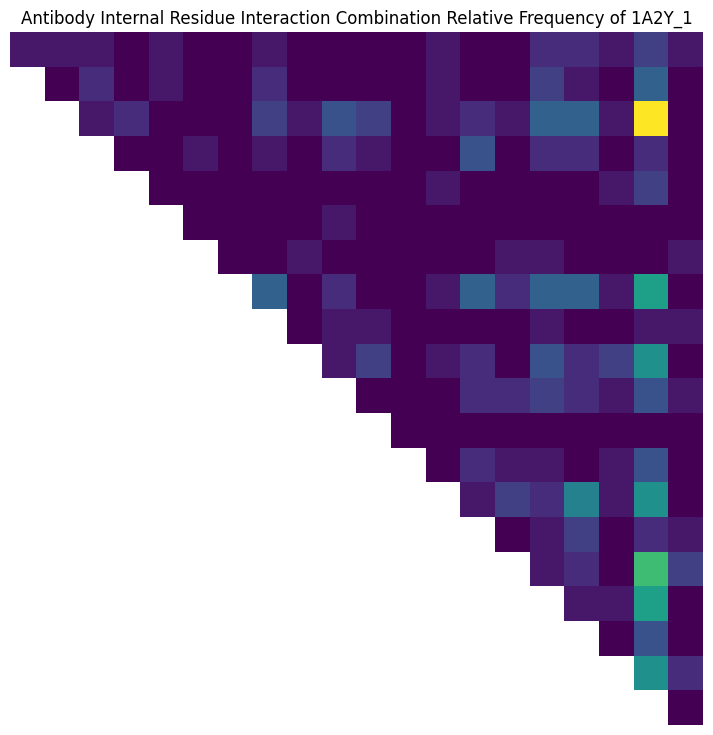

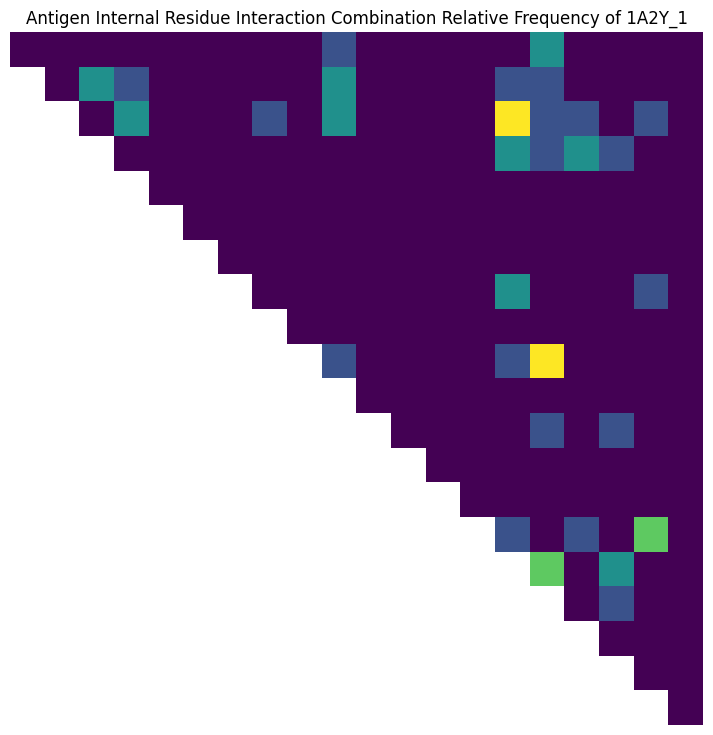

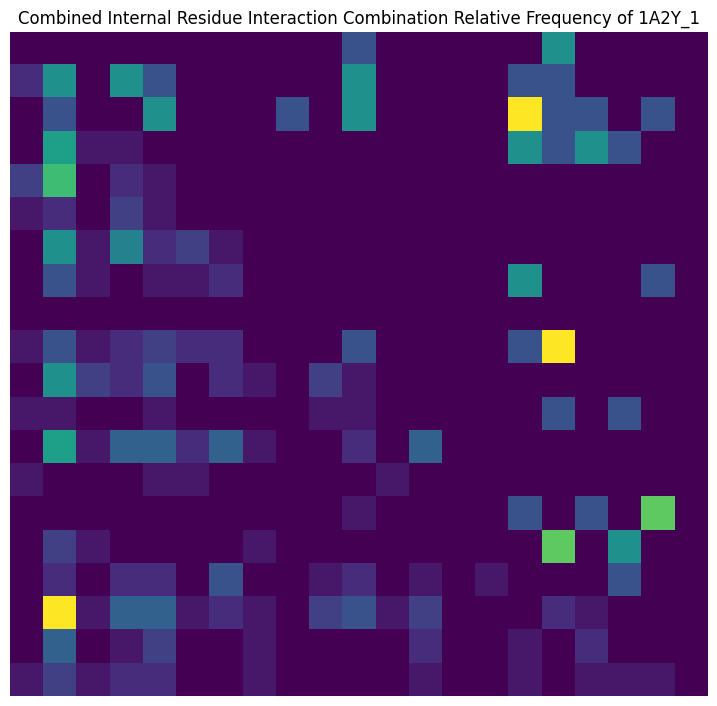

In [7]:
AbFreqCharts, AgFreqCharts = [], []
matchFreqCharts = []
for filename in os.listdir("AbFreqChart"):
    AbFreqCharts.append(np.load("AbFreqChart/"+filename))
for filename in os.listdir("AgFreqChart"):
    AgFreqCharts.append(np.load("AgFreqChart/"+filename))
for i, (Ab, Ag) in enumerate(zip(AbFreqCharts, AgFreqCharts)):
    if i > 0:
        break
    fig = plt.figure(figsize=(9, 9))
    ax = fig.add_subplot(111)
    ax.axis("off")
    ax.imshow(Ab)
    plt.title("Antibody Internal Residue Interaction Combination Relative Frequency of 1A2Y_1")

    fig = plt.figure(figsize=(9, 9))
    ax = fig.add_subplot(111)
    ax.axis("off")
    ax.imshow(Ag)
    plt.title("Antigen Internal Residue Interaction Combination Relative Frequency of 1A2Y_1")

    flippedAb = np.flip(Ab)
    matchFreqChart = np.concatenate([flippedAb, Ag], axis=1)
    matchFreqChart = np.array([r[~np.isnan(r)] for r in matchFreqChart])
    fig = plt.figure(figsize=(9, 9))
    ax = fig.add_subplot(111)
    ax.axis("off")
    ax.imshow(matchFreqChart)
    plt.title("Combined Internal Residue Interaction Combination Relative Frequency of 1A2Y_1")

In [8]:
print( len(os.listdir('AbFreqChart')), len(os.listdir('AgFreqChart')) )
# 6jqm_1 was removed since it had no antigen interaction

1215 1215


## Non-matching dataset

In [9]:
AbFreqCharts, AgFreqCharts = [], []
os.makedirs("nonmatchData")
for filename in os.listdir("AbFreqChart"):
    AbFreqCharts.append(np.load("AbFreqChart/"+filename))
for filename in os.listdir("AgFreqChart"):
    AgFreqCharts.append(np.load("AgFreqChart/"+filename))

prevNonmatchIndPairs = []
for i in range(1215):
    correct = False
    while not correct:
        AbInd, AgInd = np.random.randint(0, 1215), np.random.randint(0, 1215)
        if AbInd != AgInd and (AbInd, AgInd) not in prevNonmatchIndPairs: # make sure no repeats
            prevNonmatchIndPairs.append((AbInd, AgInd))
            correct = True
            # Combine array
            Ab = np.flip(AbFreqCharts[AbInd])
            Ag = AgFreqCharts[AgInd]
            nonmatchFreqChart = np.concatenate([Ab, Ag], axis=1)
            nonmatchFreqChart = np.array([r[~np.isnan(r)] for r in nonmatchFreqChart])
            with open("nonmatchData/"+os.listdir("AbFreqChart")[AbInd][:-4] + "__" + os.listdir('AgFreqChart')[AgInd], "wb") as f: # Ab comes first
                np.save(f, nonmatchFreqChart)

## Machine Learning

### Load Data into Keras Tensor Format

In [5]:
matchingArr, mismatchArr = [], []
for filename in os.listdir("matchData"):
    matchingArr.append(np.load("matchData/"+filename))
for filename in os.listdir("nonmatchData"):
    mismatchArr.append(np.load("nonmatchData/"+filename))

#### Create dataset with mismatched values

In [6]:
data, labels = [], []
for arr in matchingArr:
    data.append(arr)
    labels.append(1)
for arr in mismatchArr:
    data.append(arr)
    labels.append(0)
data = np.array(data)
labels = np.array(labels).reshape(-1, 1)

#### Display Example (Index 1214/1215 is the boundary)

(20, 21)


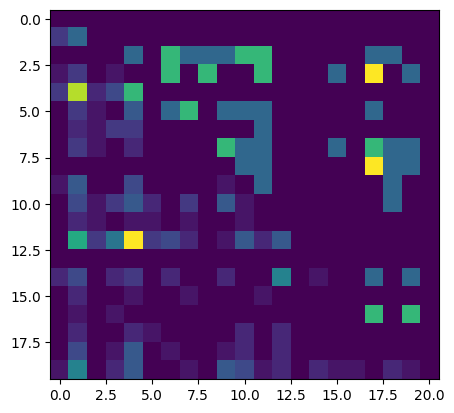

In [7]:
plt.imshow(data[1214])
print(data[0].shape)

### Model Creation

In [15]:
def plot_roc_curve(fpr,tpr, title):
    fig = plt.figure(figsize=(15, 15)) 
    plt.plot(fpr, tpr, linewidth=6.0)
    plt.axis([0,1,0,1]) 
    plt.title(title)
    plt.xlabel('False Positive Rate') 
    plt.ylabel('True Positive Rate') 
    plt.show()    

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 20, 21, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 10, 11, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 10, 11, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 5, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 5, 6, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 3, 3, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       147,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 199,681 (780.00 KB)

 Trainable params: 199,681 (780.00 KB)

 Non-trainable params: 0 (0.00 B)

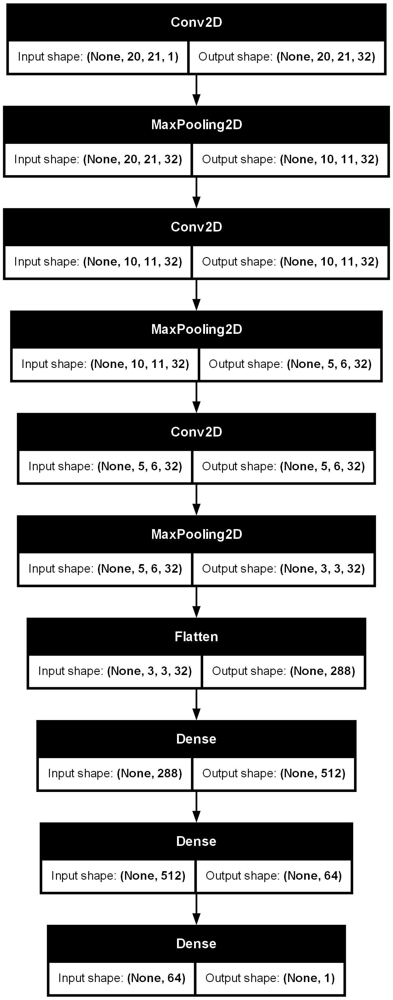

In [10]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Input, Dropout
from keras import applications
from tensorflow.keras.utils import plot_model

def create_model_mismatch():
    # base_model=applications.VGG16(include_top=False, weights='imagenet',input_tensor=Input(shape=(20, 21, 1)))
    # for layer in base_model.layers:
    #     layer.trainable = False
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu', input_shape=(20,21,1)))
    model.add(MaxPooling2D((2, 2), padding='same'))
    #model.add(Dropout(0.25))

    model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu'))
    model.add(MaxPooling2D((2, 2), padding='same'))
    #model.add(Dropout(0.25))

    model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu'))
    model.add(MaxPooling2D((2, 2), padding='same'))

    model.add(Flatten())

    model.add(Dense(512, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    
    return model

m = create_model_mismatch()
m.summary()
# Plot and save the model architecture
plot_model(m, to_file='cnn_model1.png', show_shapes=True)

Epoch 1/1000


C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4864 - loss: 0.6941 - precision: 0.4858 - recall: 0.9949 - val_accuracy: 0.5021 - val_loss: 0.6935 - val_precision: 0.5021 - val_recall: 1.0000
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4949 - loss: 0.6934 - precision: 0.4930 - recall: 0.9826 - val_accuracy: 0.4938 - val_loss: 0.6935 - val_precision: 0.4978 - val_recall: 0.9426
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5056 - loss: 0.6928 - precision: 0.5028 - recall: 0.9276 - val_accuracy: 0.4527 - val_loss: 0.6935 - val_precision: 0.4726 - val_recall: 0.7787
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5409 - loss: 0.6927 - precision: 0.5260 - recall: 0.6825 - val_accuracy: 0.4568 - val_loss: 0.6935 - val_precision: 0.4734 - val_recall: 0.7295
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5251 - loss: 0.6929 - precision: 0.5148 - recall: 0.6984 - val_accuracy: 0.4733 - val_loss: 0.693

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4933 - loss: 0.6932 - precision_1: 0.4967 - recall_1: 0.8275 - val_accuracy: 0.5144 - val_loss: 0.6933 - val_precision_1: 0.5133 - val_recall_1: 0.6311
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5379 - loss: 0.6929 - precision_1: 0.5397 - recall_1: 0.3939 - val_accuracy: 0.5103 - val_loss: 0.6933 - val_precision_1: 0.5172 - val_recall_1: 0.3689
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5264 - loss: 0.6927 - precision_1: 0.5352 - recall_1: 0.7011 - val_accuracy: 0.5103 - val_loss: 0.6933 - val_precision_1: 0.5158 - val_recall_1: 0.4016
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5161 - loss: 0.6927 - precision_1: 0.5169 - recall_1: 0.5810 - val_accuracy: 0.5062 - val_loss: 0.6933 - val_precision_1: 0.5085 - val_recall_1: 0.4918
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5377 - loss: 0.6926 - precision_1: 0.5574 - recall_1: 0.2358 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4777 - loss: 0.6934 - precision_2: 0.4446 - recall_2: 0.2185 - val_accuracy: 0.5021 - val_loss: 0.6929 - val_precision_2: 0.5063 - val_recall_2: 0.3279
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4905 - loss: 0.6932 - precision_2: 0.4954 - recall_2: 0.4161 - val_accuracy: 0.4815 - val_loss: 0.6930 - val_precision_2: 0.4778 - val_recall_2: 0.3525
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4997 - loss: 0.6931 - precision_2: 0.5161 - recall_2: 0.5513 - val_accuracy: 0.5103 - val_loss: 0.6930 - val_precision_2: 0.5116 - val_recall_2: 0.5410
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5177 - loss: 0.6929 - precision_2: 0.5302 - recall_2: 0.4383 - val_accuracy: 0.4938 - val_loss: 0.6930 - val_precision_2: 0.4941 - val_recall_2: 0.3443
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5381 - loss: 0.6928 - precision_2: 0.5458 - recall_2: 0.4320 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4915 - loss: 0.6932 - precision_3: 0.4205 - recall_3: 0.0531 - val_accuracy: 0.4691 - val_loss: 0.6935 - val_precision_3: 0.2667 - val_recall_3: 0.0328
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5064 - loss: 0.6930 - precision_3: 0.5213 - recall_3: 0.2098 - val_accuracy: 0.4733 - val_loss: 0.6935 - val_precision_3: 0.4423 - val_recall_3: 0.1885
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4964 - loss: 0.6930 - precision_3: 0.5071 - recall_3: 0.5273 - val_accuracy: 0.4856 - val_loss: 0.6935 - val_precision_3: 0.4634 - val_recall_3: 0.1557
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5301 - loss: 0.6926 - precision_3: 0.5180 - recall_3: 0.0742 - val_accuracy: 0.4691 - val_loss: 0.6935 - val_precision_3: 0.4407 - val_recall_3: 0.2131
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5317 - loss: 0.6926 - precision_3: 0.5274 - recall_3: 0.3815 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4944 - loss: 0.6933 - precision_4: 0.4916 - recall_4: 0.6382 - val_accuracy: 0.5514 - val_loss: 0.6928 - val_precision_4: 0.5474 - val_recall_4: 0.6148
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5227 - loss: 0.6931 - precision_4: 0.5237 - recall_4: 0.8213 - val_accuracy: 0.5473 - val_loss: 0.6928 - val_precision_4: 0.5448 - val_recall_4: 0.5984
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5144 - loss: 0.6931 - precision_4: 0.5173 - recall_4: 0.6411 - val_accuracy: 0.5556 - val_loss: 0.6928 - val_precision_4: 0.5593 - val_recall_4: 0.5410
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5172 - loss: 0.6931 - precision_4: 0.5111 - recall_4: 0.4961 - val_accuracy: 0.5391 - val_loss: 0.6928 - val_precision_4: 0.5362 - val_recall_4: 0.6066
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5363 - loss: 0.6930 - precision_4: 0.5349 - recall_4: 0.4751 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4647 - loss: 0.6933 - precision_5: 0.4674 - recall_5: 0.4236 - val_accuracy: 0.5185 - val_loss: 0.6929 - val_precision_5: 0.5270 - val_recall_5: 0.3223
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5191 - loss: 0.6929 - precision_5: 0.5084 - recall_5: 0.3382 - val_accuracy: 0.5350 - val_loss: 0.6930 - val_precision_5: 0.5345 - val_recall_5: 0.5124
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5190 - loss: 0.6928 - precision_5: 0.5143 - recall_5: 0.3676 - val_accuracy: 0.5309 - val_loss: 0.6930 - val_precision_5: 0.5354 - val_recall_5: 0.4380
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5391 - loss: 0.6925 - precision_5: 0.5409 - recall_5: 0.4836 - val_accuracy: 0.5226 - val_loss: 0.6931 - val_precision_5: 0.5253 - val_recall_5: 0.4298
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5233 - loss: 0.6926 - precision_5: 0.5363 - recall_5: 0.3986 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4795 - loss: 0.6938 - precision_6: 0.4811 - recall_6: 0.7836 - val_accuracy: 0.5062 - val_loss: 0.6931 - val_precision_6: 0.5027 - val_recall_6: 0.7603
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5009 - loss: 0.6932 - precision_6: 0.4953 - recall_6: 0.6507 - val_accuracy: 0.5391 - val_loss: 0.6933 - val_precision_6: 0.5246 - val_recall_6: 0.7934
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4976 - loss: 0.6931 - precision_6: 0.4922 - recall_6: 0.6113 - val_accuracy: 0.5226 - val_loss: 0.6933 - val_precision_6: 0.5145 - val_recall_6: 0.7355
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5280 - loss: 0.6929 - precision_6: 0.5235 - recall_6: 0.5750 - val_accuracy: 0.4733 - val_loss: 0.6934 - val_precision_6: 0.4701 - val_recall_6: 0.4545
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5449 - loss: 0.6926 - precision_6: 0.5702 - recall_6: 0.2131 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4981 - loss: 0.6938 - precision_7: 0.4977 - recall_7: 0.9945 - val_accuracy: 0.4938 - val_loss: 0.6929 - val_precision_7: 0.4959 - val_recall_7: 0.9917
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4844 - loss: 0.6935 - precision_7: 0.4845 - recall_7: 0.8678 - val_accuracy: 0.5144 - val_loss: 0.6929 - val_precision_7: 0.5067 - val_recall_7: 0.9339
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5215 - loss: 0.6928 - precision_7: 0.5189 - recall_7: 0.9114 - val_accuracy: 0.4774 - val_loss: 0.6930 - val_precision_7: 0.4828 - val_recall_7: 0.6942
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4862 - loss: 0.6932 - precision_7: 0.4836 - recall_7: 0.5205 - val_accuracy: 0.4815 - val_loss: 0.6931 - val_precision_7: 0.4771 - val_recall_7: 0.4298
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5194 - loss: 0.6926 - precision_7: 0.5043 - recall_7: 0.3087 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5094 - loss: 0.6932 - precision_8: 0.5064 - recall_8: 0.8103 - val_accuracy: 0.4321 - val_loss: 0.6938 - val_precision_8: 0.4341 - val_recall_8: 0.4628
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4963 - loss: 0.6931 - precision_8: 0.4694 - recall_8: 0.3617 - val_accuracy: 0.4609 - val_loss: 0.6938 - val_precision_8: 0.4695 - val_recall_8: 0.6364
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5088 - loss: 0.6927 - precision_8: 0.5068 - recall_8: 0.6321 - val_accuracy: 0.4403 - val_loss: 0.6938 - val_precision_8: 0.4409 - val_recall_8: 0.4628
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5118 - loss: 0.6928 - precision_8: 0.5105 - recall_8: 0.6318 - val_accuracy: 0.4403 - val_loss: 0.6939 - val_precision_8: 0.4400 - val_recall_8: 0.4545
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5317 - loss: 0.6926 - precision_8: 0.5267 - recall_8: 0.3989 - va

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5086 - loss: 0.6931 - precision_9: 0.5031 - recall_9: 0.9642 - val_accuracy: 0.4815 - val_loss: 0.6937 - val_precision_9: 0.4890 - val_recall_9: 0.9174
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5073 - loss: 0.6930 - precision_9: 0.5085 - recall_9: 0.8884 - val_accuracy: 0.4527 - val_loss: 0.6937 - val_precision_9: 0.4677 - val_recall_9: 0.7190
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5194 - loss: 0.6928 - precision_9: 0.5032 - recall_9: 0.7282 - val_accuracy: 0.4527 - val_loss: 0.6938 - val_precision_9: 0.4625 - val_recall_9: 0.6116
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5543 - loss: 0.6926 - precision_9: 0.5457 - recall_9: 0.6172 - val_accuracy: 0.4362 - val_loss: 0.6939 - val_precision_9: 0.4529 - val_recall_9: 0.6364
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5229 - loss: 0.6926 - precision_9: 0.5195 - recall_9: 0.7945 - va

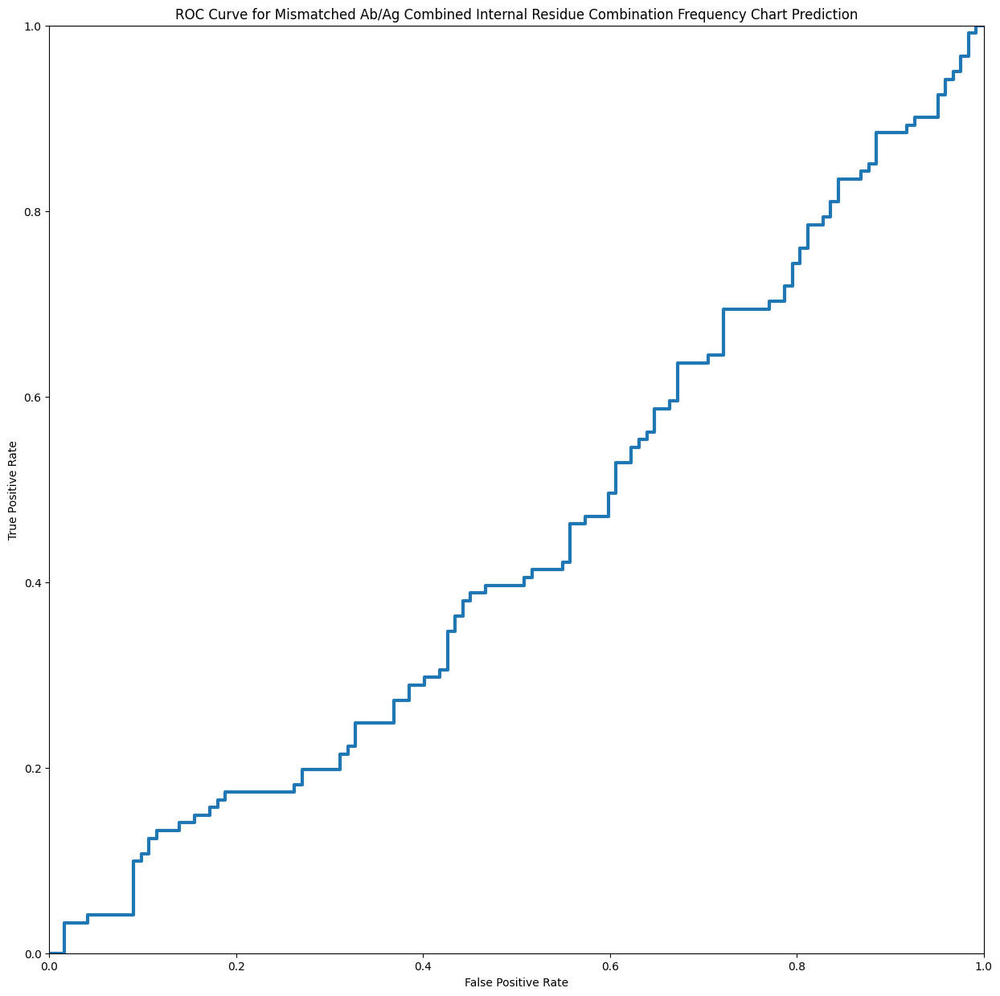

0.4424197263243463
[0.52098765 0.69339483 0.49760195 0.52771231 0.55288579 0.50458637]


In [11]:
from sklearn.model_selection import StratifiedKFold
from keras.losses import BinaryCrossentropy
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from keras.metrics import Precision, Recall
from sklearn.metrics import roc_curve, roc_auc_score

kfold = StratifiedKFold(10, shuffle=True, random_state=9001)
accs, aucs, losses, precs, recs, f1s = [np.zeros(10) for _ in range(6)]

for i, (trainInds, testInds) in enumerate(kfold.split(data, labels)):
    model = create_model_mismatch()
    X_train, X_test, y_train, y_test = data[trainInds], data[testInds], labels[trainInds], labels[testInds]
    X_train = np.expand_dims(X_train, axis=-1)
    X_test = np.expand_dims(X_test, axis=-1)

    model.compile(optimizer=Adam(learning_rate=1e-5),
                  loss=BinaryCrossentropy(),
                  metrics=['accuracy', Precision(), Recall()])
    
    es = EarlyStopping('val_accuracy', patience=15, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=1000, batch_size=14,
                        validation_data=(X_test, y_test), callbacks=(es))
    test_loss, test_acc, test_prec, test_rec = model.evaluate(X_test, y_test, verbose=1)
    accs[i] = test_acc
    losses[i] = test_loss
    precs[i] = test_prec
    recs[i] = test_rec
    test_f1 = 2 * (test_prec * test_rec) / (test_prec + test_rec)
    f1s[i] = test_f1
    prediction = model.predict(X_test)
    fpr, tpr, thresholds = roc_curve(y_test, prediction)
    auc_score=roc_auc_score(y_test, prediction)
    aucs[i] = auc_score
    if i == 9:
        plot_roc_curve(fpr, tpr, "ROC Curve for Mismatched Ab/Ag Combined Internal Residue Combination Frequency Chart Prediction")
        print(auc_score)

In [12]:
print(np.mean(np.array([accs, losses, aucs, precs, recs, f1s]), axis=1))
print(np.std(np.array([accs, losses, aucs, precs, recs, f1s]), axis=1))

[0.52098765 0.69339483 0.49760195 0.52771231 0.55288579 0.50458637]
[0.01905488 0.00053912 0.0383525  0.02274406 0.25104598 0.13745772]


## Redo with random values

In [13]:
data, labels = [], []
for arr in matchingArr:
    data.append(arr)
    labels.append(1)
for arr in mismatchArr:
    data.append(np.random.rand(20, 21))
    labels.append(0)
data = np.array(data)
labels = np.array(labels).reshape(-1, 1)

Epoch 1/1000


C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5374 - loss: 0.6570 - precision_20: 0.0000e+00 - recall_20: 0.0000e+00 - val_accuracy: 0.4979 - val_loss: 0.6111 - val_precision_20: 0.0000e+00 - val_recall_20: 0.0000e+00
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5214 - loss: 0.5819 - precision_20: 0.2405 - recall_20: 0.0020 - val_accuracy: 0.6914 - val_loss: 0.5061 - val_precision_20: 1.0000 - val_recall_20: 0.3852
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8330 - loss: 0.4588 - precision_20: 1.0000 - recall_20: 0.6546 - val_accuracy: 1.0000 - val_loss: 0.3343 - val_precision_20: 1.0000 - val_recall_20: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2911 - precision_20: 1.0000 - recall_20: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1709 - val_precision_20: 1.0000 - val_recall_20: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.1395 - precision_2

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5240 - loss: 0.6770 - precision_21: 0.6301 - recall_21: 0.1976 - val_accuracy: 0.4979 - val_loss: 0.6193 - val_precision_21: 0.0000e+00 - val_recall_21: 0.0000e+00
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5209 - loss: 0.5919 - precision_21: 0.5063 - recall_21: 0.0182 - val_accuracy: 0.8313 - val_loss: 0.5028 - val_precision_21: 1.0000 - val_recall_21: 0.6639
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9464 - loss: 0.4580 - precision_21: 1.0000 - recall_21: 0.8924 - val_accuracy: 1.0000 - val_loss: 0.3094 - val_precision_21: 1.0000 - val_recall_21: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2601 - precision_21: 1.0000 - recall_21: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1369 - val_precision_21: 1.0000 - val_recall_21: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.1110 - precision_21: 1.000

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4613 - loss: 0.6797 - precision_22: 0.4805 - recall_22: 0.2138 - val_accuracy: 0.4979 - val_loss: 0.6162 - val_precision_22: 0.0000e+00 - val_recall_22: 0.0000e+00
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5199 - loss: 0.5890 - precision_22: 0.5063 - recall_22: 0.0182 - val_accuracy: 0.8477 - val_loss: 0.5014 - val_precision_22: 1.0000 - val_recall_22: 0.6967
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9152 - loss: 0.4666 - precision_22: 1.0000 - recall_22: 0.8369 - val_accuracy: 1.0000 - val_loss: 0.3167 - val_precision_22: 1.0000 - val_recall_22: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2687 - precision_22: 1.0000 - recall_22: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1383 - val_precision_22: 1.0000 - val_recall_22: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.1117 - precision_22: 1.000

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4845 - loss: 0.6744 - precision_23: 0.5698 - recall_23: 0.0072 - val_accuracy: 0.4979 - val_loss: 0.6134 - val_precision_23: 0.0000e+00 - val_recall_23: 0.0000e+00
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4949 - loss: 0.5888 - precision_23: 0.4367 - recall_23: 0.0055 - val_accuracy: 0.6749 - val_loss: 0.4907 - val_precision_23: 1.0000 - val_recall_23: 0.3525
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8726 - loss: 0.4417 - precision_23: 1.0000 - recall_23: 0.7438 - val_accuracy: 1.0000 - val_loss: 0.2990 - val_precision_23: 1.0000 - val_recall_23: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2438 - precision_23: 1.0000 - recall_23: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1253 - val_precision_23: 1.0000 - val_recall_23: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0974 - precision_23: 1.000

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5786 - loss: 0.6997 - precision_24: 0.5491 - recall_24: 0.9994 - val_accuracy: 0.9794 - val_loss: 0.6453 - val_precision_24: 1.0000 - val_recall_24: 0.9590
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9941 - loss: 0.6233 - precision_24: 1.0000 - recall_24: 0.9869 - val_accuracy: 1.0000 - val_loss: 0.5306 - val_precision_24: 1.0000 - val_recall_24: 1.0000
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.4826 - precision_24: 1.0000 - recall_24: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.3096 - val_precision_24: 1.0000 - val_recall_24: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2540 - precision_24: 1.0000 - recall_24: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1144 - val_precision_24: 1.0000 - val_recall_24: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0887 - precision_24: 1.0000 - reca

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7626 - loss: 0.6796 - precision_25: 0.7984 - recall_25: 0.7703 - val_accuracy: 0.5802 - val_loss: 0.6321 - val_precision_25: 1.0000 - val_recall_25: 0.1570
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7016 - loss: 0.6092 - precision_25: 1.0000 - recall_25: 0.4272 - val_accuracy: 1.0000 - val_loss: 0.5003 - val_precision_25: 1.0000 - val_recall_25: 1.0000
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9991 - loss: 0.4504 - precision_25: 1.0000 - recall_25: 0.9982 - val_accuracy: 1.0000 - val_loss: 0.2822 - val_precision_25: 1.0000 - val_recall_25: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2334 - precision_25: 1.0000 - recall_25: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1100 - val_precision_25: 1.0000 - val_recall_25: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0871 - precision_25: 1.0000 - reca

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5972 - loss: 0.6810 - precision_26: 0.6929 - recall_26: 0.4395 - val_accuracy: 0.6790 - val_loss: 0.6324 - val_precision_26: 1.0000 - val_recall_26: 0.3554
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7819 - loss: 0.6075 - precision_26: 1.0000 - recall_26: 0.5629 - val_accuracy: 1.0000 - val_loss: 0.5054 - val_precision_26: 1.0000 - val_recall_26: 1.0000
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9988 - loss: 0.4562 - precision_26: 1.0000 - recall_26: 0.9976 - val_accuracy: 1.0000 - val_loss: 0.2847 - val_precision_26: 1.0000 - val_recall_26: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2262 - precision_26: 1.0000 - recall_26: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.0983 - val_precision_26: 1.0000 - val_recall_26: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0775 - precision_26: 1.0000 - reca

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5359 - loss: 0.6793 - precision_27: 0.5446 - recall_27: 0.3939 - val_accuracy: 0.5597 - val_loss: 0.6148 - val_precision_27: 1.0000 - val_recall_27: 0.1157
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6221 - loss: 0.5831 - precision_27: 1.0000 - recall_27: 0.2420 - val_accuracy: 0.9506 - val_loss: 0.4739 - val_precision_27: 1.0000 - val_recall_27: 0.9008
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9756 - loss: 0.4282 - precision_27: 1.0000 - recall_27: 0.9525 - val_accuracy: 1.0000 - val_loss: 0.2754 - val_precision_27: 1.0000 - val_recall_27: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.2290 - precision_27: 1.0000 - recall_27: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1134 - val_precision_27: 1.0000 - val_recall_27: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0928 - precision_27: 1.0000 - reca

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5877 - loss: 0.6783 - precision_28: 0.7073 - recall_28: 0.3206 - val_accuracy: 0.5185 - val_loss: 0.6287 - val_precision_28: 1.0000 - val_recall_28: 0.0331
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5431 - loss: 0.6082 - precision_28: 0.9937 - recall_28: 0.0918 - val_accuracy: 0.8148 - val_loss: 0.5235 - val_precision_28: 1.0000 - val_recall_28: 0.6281
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9133 - loss: 0.4852 - precision_28: 1.0000 - recall_28: 0.8192 - val_accuracy: 1.0000 - val_loss: 0.3680 - val_precision_28: 1.0000 - val_recall_28: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.3252 - precision_28: 1.0000 - recall_28: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1803 - val_precision_28: 1.0000 - val_recall_28: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.1476 - precision_28: 1.0000 - reca

C:\Users\Tom\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5186 - loss: 0.6890 - precision_29: 0.5117 - recall_29: 0.6031 - val_accuracy: 0.5103 - val_loss: 0.6160 - val_precision_29: 1.0000 - val_recall_29: 0.0165
Epoch 2/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5118 - loss: 0.5956 - precision_29: 0.8418 - recall_29: 0.0331 - val_accuracy: 0.7737 - val_loss: 0.5084 - val_precision_29: 1.0000 - val_recall_29: 0.5455
Epoch 3/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9000 - loss: 0.4617 - precision_29: 1.0000 - recall_29: 0.7816 - val_accuracy: 1.0000 - val_loss: 0.3274 - val_precision_29: 1.0000 - val_recall_29: 1.0000
Epoch 4/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 1.0000 - loss: 0.2794 - precision_29: 1.0000 - recall_29: 1.0000 - val_accuracy: 1.0000 - val_loss: 0.1462 - val_precision_29: 1.0000 - val_recall_29: 1.0000
Epoch 5/1000
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 1.0000 - loss: 0.1141 - precision_29: 1.0000 - reca

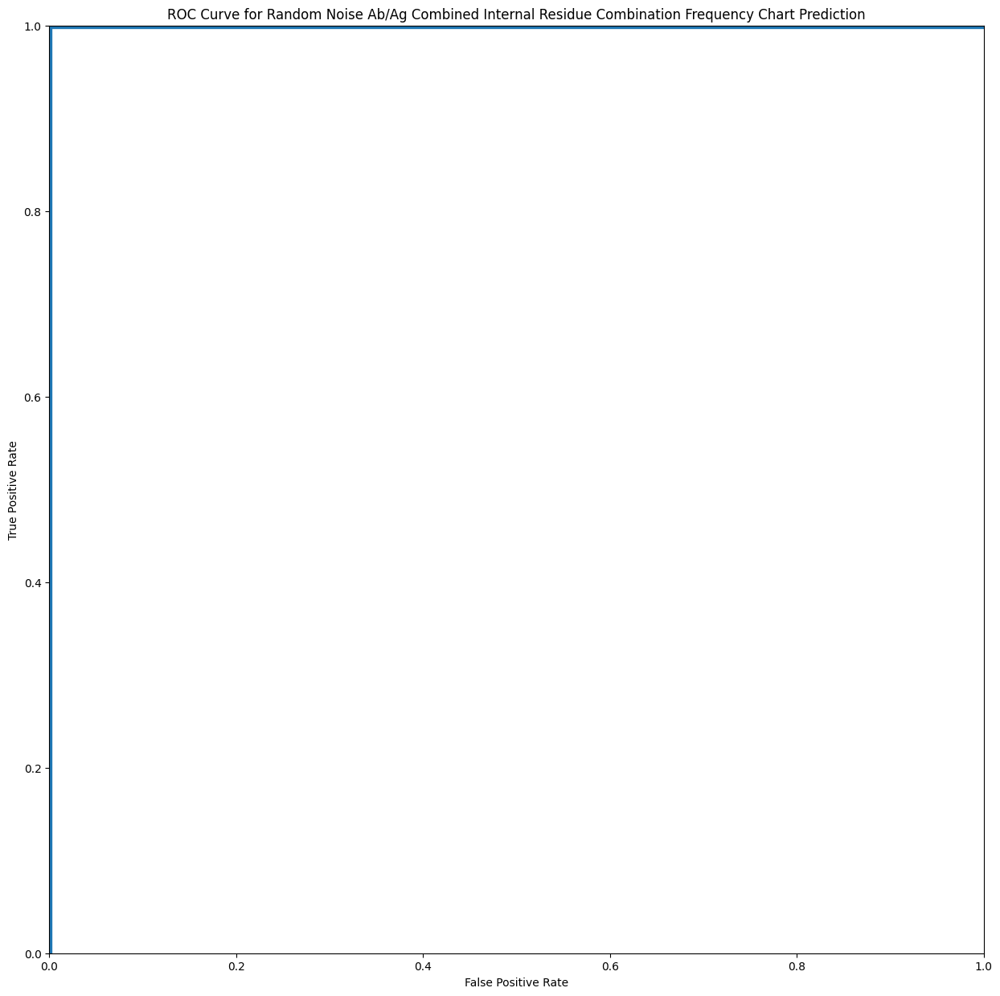

1.0
[1.         0.37663127 1.         1.         1.         1.        ]
[0.         0.09179654 0.         0.         0.         0.        ]


In [16]:
from sklearn.model_selection import StratifiedKFold
from keras.losses import BinaryCrossentropy
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from keras.metrics import Precision, Recall
from sklearn.metrics import roc_curve, roc_auc_score

kfold = StratifiedKFold(10, shuffle=True, random_state=9001)
accs, aucs, losses, precs, recs, f1s = [np.zeros(10) for _ in range(6)]

for i, (trainInds, testInds) in enumerate(kfold.split(data, labels)):
    model = create_model_mismatch()
    X_train, X_test, y_train, y_test = data[trainInds], data[testInds], labels[trainInds], labels[testInds]
    X_train = np.expand_dims(X_train, axis=-1)
    X_test = np.expand_dims(X_test, axis=-1)

    model.compile(optimizer=Adam(learning_rate=1e-5),
                  loss=BinaryCrossentropy(),
                  metrics=['accuracy', Precision(), Recall()])
    
    # best_weights_file="weights.best.hdf5"
    # checkpoint = ModelCheckpoint(best_weights_file, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    es = EarlyStopping('val_accuracy', patience=15, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=1000, batch_size=14,
                        validation_data=(X_test, y_test), callbacks=(es))
    test_loss, test_acc, test_prec, test_rec = model.evaluate(X_test, y_test, verbose=1)
    accs[i] = test_acc
    losses[i] = test_loss
    precs[i] = test_prec
    recs[i] = test_rec
    test_f1 = 2 * (test_prec * test_rec) / (test_prec + test_rec)
    f1s[i] = test_f1
    prediction = model.predict(X_test)
    fpr, tpr, thresholds = roc_curve(y_test, prediction)
    auc_score=roc_auc_score(y_test, prediction)
    aucs[i] = auc_score
    if i == 9:
        plot_roc_curve(fpr, tpr, "ROC Curve for Random Noise Ab/Ag Combined Internal Residue Combination Frequency Chart Prediction")
        print(auc_score)
print(np.mean(np.array([accs, losses, aucs, precs, recs, f1s]), axis=1))
print(np.std(np.array([accs, losses, aucs, precs, recs, f1s]), axis=1))